# Image Classification

Tumor Detection:
- The dataset is for tumor detection.
- To download the dataset, click on the following link.
- [TDC](https://www.kaggle.com/datasets/davidbroberts/brain-tumor-object-detection-datasets/download?datasetVersionNumber=5)

# Uploading the data

In [1]:
import os
from PIL import Image
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models


image_folder_path = r'C:\Users\arshi\Downloads\archive (3)\axial_t1wce_2_class\images\train'
label_folder_path = r'C:\Users\arshi\Downloads\archive (3)\axial_t1wce_2_class\labels\train'


# List all image files in the image folder
image_files = [file for file in os.listdir(image_folder_path) if file.lower().endswith('.jpg')]

C:\Users\arshi\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\arshi\anaconda3\lib\site-packages\numpy\.libs\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll
C:\Users\arshi\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


# Preprocessing

In this section we did the followings:
1. Neglected the unlabeled images.
2. Resized the images (not all of them had the same size).
3. Made images np arrays.
4. Selected the labels from text fiels (If you check the text fiels, there are 5 numbers, only the first integer is the label).

In [2]:
# Initialize a list to store image arrays and labels
data = []

# Desired size
target_size = (225, 225)

# Loop through each image file and process
for image_file in image_files:
    # Construct the full path to the image file
    image_path = os.path.join(image_folder_path, image_file)

    # Construct the full path to the label file
    label_file_path = os.path.join(label_folder_path, image_file.replace('.jpg', '.txt'))

    # Check if the label file exists
    if os.path.exists(label_file_path):
        # Open and resize the image
        image = Image.open(image_path)
        resized_image = image.resize(target_size)
        resized_image_array = np.array(resized_image)

        with open(label_file_path, 'r') as label_file:
            # Read the first number (already an int)
            label = int(label_file.readline().strip().split()[0])

        # Append the image array and label to the list
        data.append((resized_image_array, label))

# Convert the list of image arrays and labels to NumPy arrays
image_arrays, labels = zip(*data)
image_arrays = np.array(image_arrays)
labels = np.array(labels)

What we achieved here?
1. Now, 'image_arrays' contains NumPy arrays of all the resized images.
2. 'labels' contains the corresponding labels (integer).

- Simple train,val split.
- As you know, 2d CNNs recieve a 3d data in their first layer. We changed the size of images to 225,225. Now we add the 3d dime.

In [3]:
# Assuming you have image_arrays and labels as NumPy arrays

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(image_arrays, labels, test_size=0.2, random_state=42)
# Reshape the images to (225, 225, 1)
X_train_processed = X_train.reshape(-1, 225, 225, 1)
X_val_processed = X_val.reshape(-1, 225, 225, 1)

# Data Visualization

It is important to plot images with labels in biomedical datasets.

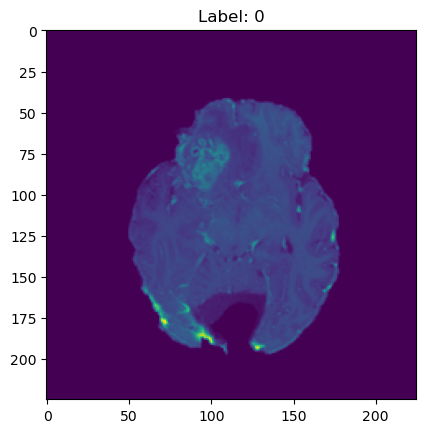

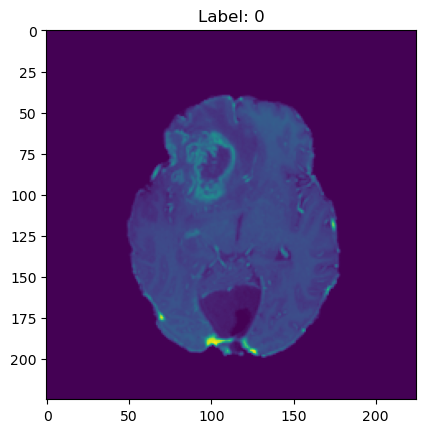

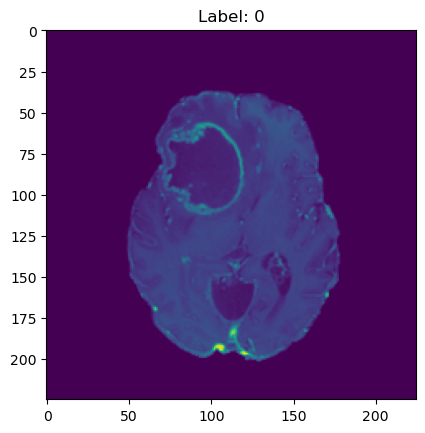

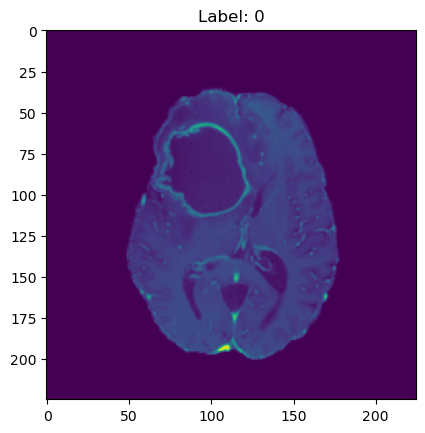

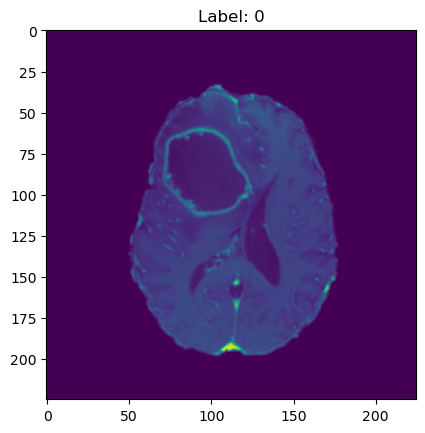

...

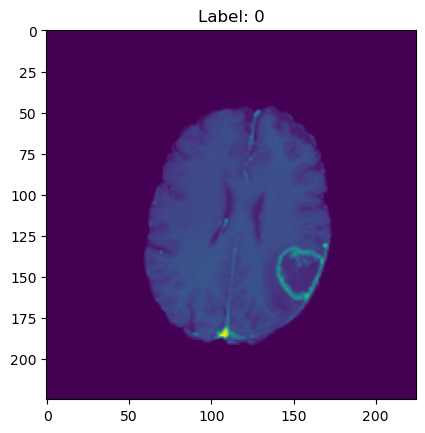

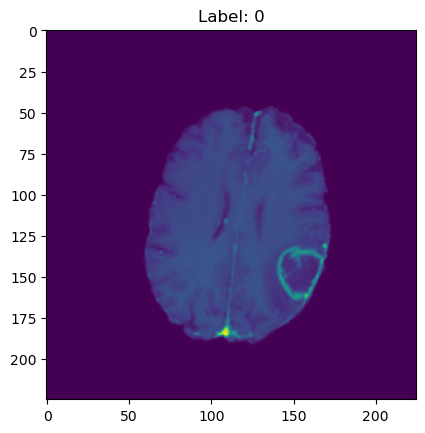

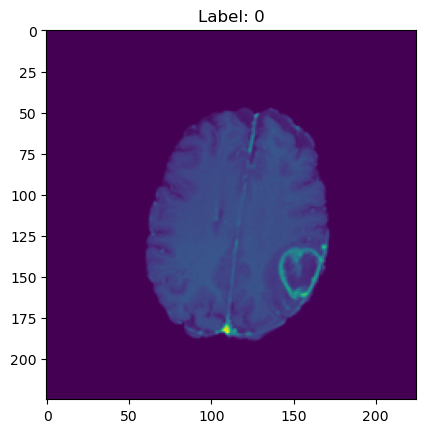

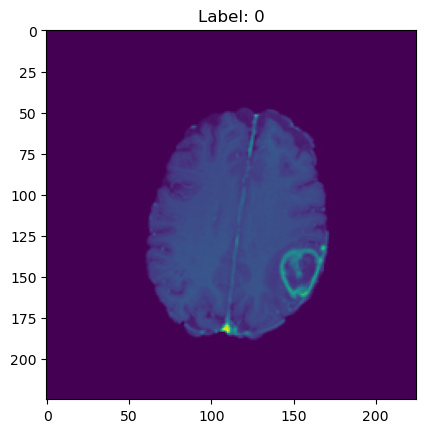

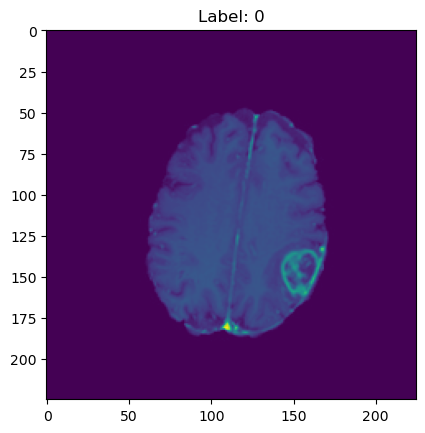


KeyboardInterrupt



In [4]:
# Assuming 'image_arrays' is a NumPy array containing image arrays

# Reshape the image arrays if you changed the shape
# For example, if your images are grayscale and have shape (height, width), you can reshape them to (height, width, 1)
image_arrays_reshaped = image_arrays.reshape(image_arrays.shape + (1,)) if len(image_arrays.shape) == 2 else image_arrays

# Loop through each image and display it
for i in range(len(image_arrays_reshaped)):
    plt.imshow(image_arrays_reshaped[i])
    plt.title(f"Label: {labels[i]}")
    plt.show()


# Defining our CNN Model and Train it

I used 3 layers of CNN with MaxPooling and a 128 Dense at the end. Adding a dropout layer is always helpful for preventing overfitting.

In [4]:
# Define the CNN model
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(225, 225, 1)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(1, activation='sigmoid'))  # Assuming binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
r = model.fit(X_train_processed, y_train, epochs=10, validation_data=(X_val_processed, y_val))




Epoch 1/10


8/8 [==============================] - 5s 445ms/step - loss: 35.2431 - accuracy: 0.5890 - val_loss: 1.7152 - val_accuracy: 0.5833
Epoch 2/10
8/8 [==============================] - 3s 412ms/step - loss: 0.8033 - accuracy: 0.7542 - val_loss: 0.5085 - val_accuracy: 0.7833
Epoch 3/10
8/8 [==============================] - 3s 416ms/step - loss: 0.3651 - accuracy: 0.8729 - val_loss: 0.4181 - val_accuracy: 0.8167
Epoch 4/10
8/8 [==============================] - 3s 412ms/step - loss: 0.1707 - accuracy: 0.9280 - val_loss: 0.4462 - val_accuracy: 0.8000
Epoch 5/10
8/8 [==============================] - 3s 416ms/step - loss: 0.0900 - accuracy: 0.9576 - val_loss: 0.4352 - val_accuracy: 0.8667
Epoch 6/10
8/8 [==============================] - 3s 413ms/step - loss: 0.0274 - accuracy: 0.9958 - val_loss: 0.3830 - val_accuracy: 0.8833
Epoch 7/10
8/8 [==============================] - 3s 413ms/step - loss: 0.0230 - accuracy: 0.9958 - val_loss: 0.3423 - val_accuracy: 0.9000
Epoch 8/10
8/8

# Testing our Model

Same process that we did for train.

In [5]:
# Specify the path to your image and label folders
image_folder_path_test = r'C:\Users\ARASOFT\Downloads\axial_t1wce_2_class\images\test'
label_folder_path_test = r'C:\Users\ARASOFT\Downloads\axial_t1wce_2_class\labels\test'


# List all image files in the image folder
image_files = [file for file in os.listdir(image_folder_path) if file.lower().endswith('.jpg')]

# Initialize a list to store image arrays and labels
data = []

# Desired size
target_size = (225, 225)

# Loop through each image file and process
for image_file in image_files:
    # Construct the full path to the image file
    image_path = os.path.join(image_folder_path, image_file)

    # Construct the full path to the label file
    label_file_path = os.path.join(label_folder_path, image_file.replace('.jpg', '.txt'))

    # Check if the label file exists
    if os.path.exists(label_file_path):
        # Open and resize the image
        image = Image.open(image_path)
        resized_image = image.resize(target_size)
        resized_image_array = np.array(resized_image)

        with open(label_file_path, 'r') as label_file:
            # Read the first number (already an int)
            label = int(label_file.readline().strip().split()[0])

        # Append the image array and label to the list
        data.append((resized_image_array, label))

# Convert the list of image arrays and labels to NumPy arrays
image_arrays, labels = zip(*data)
image_arrays = np.array(image_arrays)
labels = np.array(labels)

# Now, 'image_arrays' contains NumPy arrays of all the resized images,
# and 'labels' contains the corresponding labels (integer)

In [6]:
# Assuming you have image_arrays and labels as NumPy arrays


# Reshape the images to (225, 225, 3)
X_test = image_arrays.reshape(-1, 225, 225, 1)
y_test = labels

# Define the CNN model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy*100:.2f}%')

10/10 [==============================] - 1s 97ms/step - loss: 0.0842 - accuracy: 0.9696
Test Accuracy: 96.96%


10/10 [==============================] - 1s 97ms/step


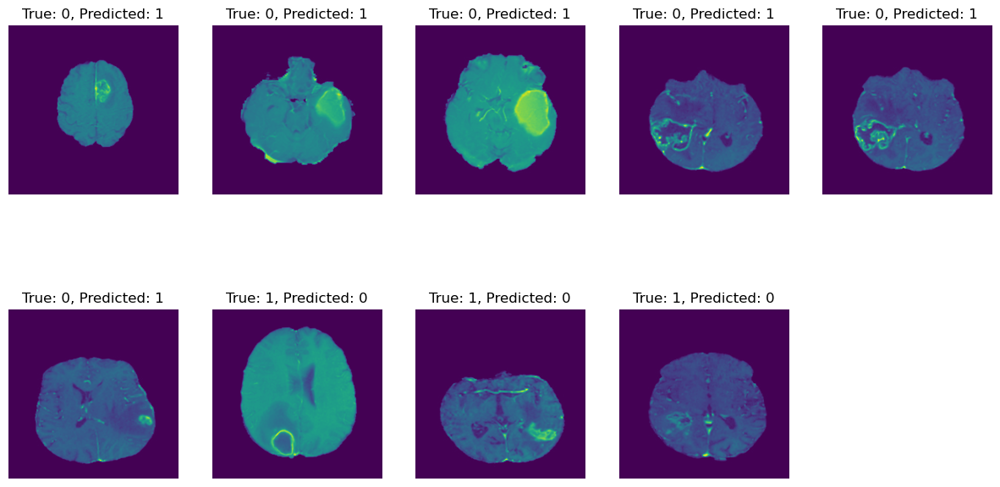

In [7]:
# Assuming you have the trained model and test data (X_test_processed, y_test) available

# Get model predictions for the test data
y_pred = model.predict(X_test)

# Convert predicted probabilities to binary labels (0 or 1)
y_pred_binary = np.round(y_pred)

# Find misclassified samples
y_pred_binary = np.reshape(y_pred_binary, (296, )).astype(int)

misclassified_indices = []

for i in range(0, y_test.shape[0]):
    if y_pred_binary[i] != y_test[i]:
        misclassified_indices.append(i)
# Number of misclassified samples to visualize
num_samples_to_visualize = min(10, len(misclassified_indices))

# Plot the misclassified samples
plt.figure(figsize=(15, 8))
for i in range(num_samples_to_visualize):
    index = misclassified_indices[i]
    true_label = y_test[index]
    predicted_label = y_pred_binary[index]

    plt.subplot(2, 5, i + 1)
    plt.imshow(X_test[index])
    plt.title(f'True: {int(true_label)}, Predicted: {int(predicted_label)}')
    plt.axis('off')

plt.show()

# Using GAN to Generate more Images

In this section, we want to use GAN generated images to see how similar it can be and also:
- Add the images to training data.
- Retrain the model with GAN generated data added to training dataset to see the change.

The followings should be considered in the architecture of GAN model:
1. The Generator part should be more complex than the Discriminator, as we want our generated images to be as real as possible.
2. We are using fully connceted neural networks for our GAN insetead of CNN-RNN for generator.

In [4]:
from keras.layers import Input, Dense, Reshape, BatchNormalization, Flatten, Conv2DTranspose, Dropout
from keras.models import Sequential

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Reshape

def build_generator(latent_dim, img_shape):
    model = Sequential()
    
    # Input layer for random noise
    model.add(Input(shape=(latent_dim,)))
    
    # Dense layers for processing noise
    model.add(Dense(512, kernel_initializer='he_normal'))
    model.add(Dropout(0.2))
    model.add(BatchNormalization())
    
    model.add(Dense(1024, activation='relu'))
    model.add(BatchNormalization())
    
    model.add(Dense(2048, activation='relu'))
    model.add(BatchNormalization())
    
    model.add(Dense(4096, activation='relu'))
    model.add(BatchNormalization())
    
    # Output layer
    model.add(Dense(np.prod(img_shape), activation='tanh'))
    model.add(Reshape(img_shape))
    
    return model

    

# Define the discriminator model
def build_discriminator(img_shape):
    model = Sequential()
    model.add(Flatten(input_shape=img_shape))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    return model

In [5]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.layers import Dense, BatchNormalization, Reshape, Conv2D, Input

img_shape = (225, 225, 1)  # Adjust according to your image dimensions
discriminator = build_discriminator(img_shape)
discriminator.compile(loss='binary_crossentropy', optimizer='Adam', metrics=['accuracy'])

# Build and compile the generator
latent_dim = 100  # Adjust according to your choice
generator = build_generator(latent_dim, img_shape)
generator.compile(loss='binary_crossentropy', optimizer='Adam')

In [6]:
from tensorflow.keras.optimizers import Adam
import numpy as np

# Combined model (GAN)
def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    return model

# Example usage
gan = build_gan(generator, discriminator)
gan.compile(loss='binary_crossentropy', optimizer='Adam')

# Training the GAN

Here, we have two option for our generator part:

1. Using random noises as input.
2. Using the real images as input.

Personally, I choose the second option. 

In [7]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Assuming X_train_processed contains your image data
# Shape of X_train_processed: (number_of_samples, height, width, channels)

# Reshape the data to a 2D array
num_samples, height, width, channels = X_train_processed.shape
X_train_flattened = X_train_processed.reshape(num_samples, -1)

# Create and fit the scaler
scaler = MinMaxScaler((-1, 1))
X_train_scaled = scaler.fit_transform(X_train_flattened)

# Reshape the scaled data back to its original shape
X_train_scaled_reshaped = X_train_scaled.reshape(num_samples, height, width, channels)

# Training the GAN
epochs = 50
batch_size = 32

fooling_images = np.empty((0,) + img_shape)
for epoch in range(epochs):
    # Initialize an empty array for each epoch

    # Select a random batch of real images from your dataset
    idx = np.random.randint(0, X_train_scaled_reshaped.shape[0], batch_size)
    real_imgs = X_train_scaled_reshaped[idx]

    # Generate random noise as input to the generator
    noise = np.random.normal(0, 1, (batch_size, latent_dim))

    # Generate fake images using the generator
    gen_imgs = generator.predict(noise)

    # Label real and fake images
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    # Train the discriminator on real and fake images
    d_loss_real = discriminator.train_on_batch(real_imgs, valid)
    d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # Check which generated images fooled the discriminator
    predicted_labels = discriminator.predict(gen_imgs)
    misclassified_indices = np.where(predicted_labels >= 0.5)[0]
    fooling_images = np.concatenate((fooling_images, gen_imgs[misclassified_indices]), axis=0)

    # Train the GAN (combined model)
    valid = np.ones((batch_size, 1))
    g_loss = gan.train_on_batch(noise, valid)

    # Print progress
    print(f"{epoch} [D loss: {d_loss[0]} | D accuracy: {100 * d_loss[1]}] [G loss: {g_loss}]")

# Now, fooling_images contains the generated images that fooled the discriminator for each epoch



1/1 [==============================] - 0s 236ms/step


1/1 [==============================] - 0s 75ms/step
0 [D loss: 0.6036980450153351 | D accuracy: 93.75] [G loss: 1.4081449508666992]
1/1 [==============================] - 0s 37ms/step
1 [D loss: 14.723213195800781 | D accuracy: 50.0] [G loss: 10.576639175415039]
1/1 [==============================] - 0s 22ms/step
2 [D loss: 3.6878557205200195 | D accuracy: 53.125] [G loss: 47.51679229736328]
1/1 [==============================] - 0s 35ms/step
3 [D loss: 9.715448527458648e-06 | D accuracy: 100.0] [G loss: 67.25498962402344]
1/1 [==============================] - 0s 31ms/step
4 [D loss: 39.766197632139466 | D accuracy: 51.5625] [G loss: 79.8226318359375]
1/1 [==============================] - 0s 31ms/step
5 [D loss: 1.3314785957336426 | D accuracy: 84.375] [G loss: 108.11351013183594]
1/1 [==============================] - 0s 16ms/step
6 [D loss: 0.07380504906177521 | D accuracy: 96.875] [G loss: 97.79524993896484]
1/1 [=============

In [8]:
# Generate images using the trained generator
generated_images = generator.predict(np.random.normal(0, 1, (num_samples, latent_dim)))

# Rescale generated images back to original range
generated_images = scaler.inverse_transform(generated_images.reshape(num_samples, -1))
generated_images = generated_images.reshape(num_samples, height, width, channels)

8/8 [==============================] - 1s 62ms/step


In [9]:
import matplotlib.pyplot as plt

# Reverse transform the rescaled images
fooling_images_original_scale = scaler.inverse_transform(fooling_images.reshape(-1, np.prod(img_shape)))

# Reshape the images back to their original shape
fooling_images_original_scale = fooling_images_original_scale.reshape(fooling_images.shape)

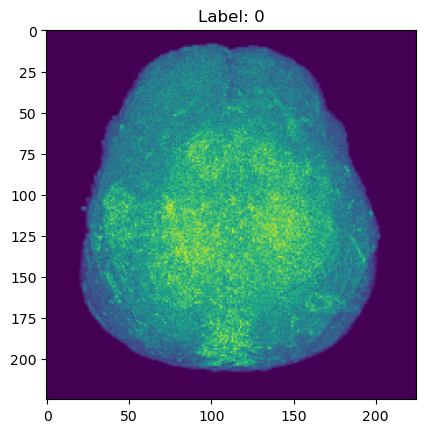

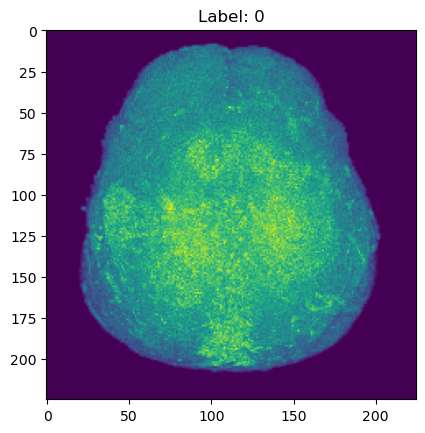

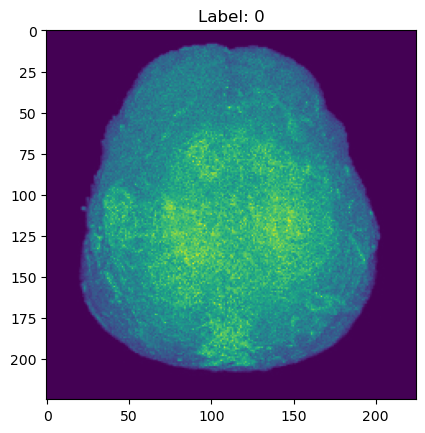

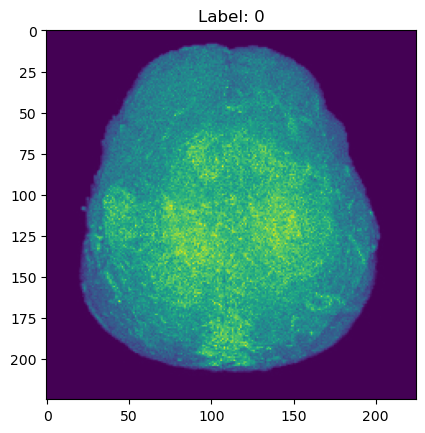

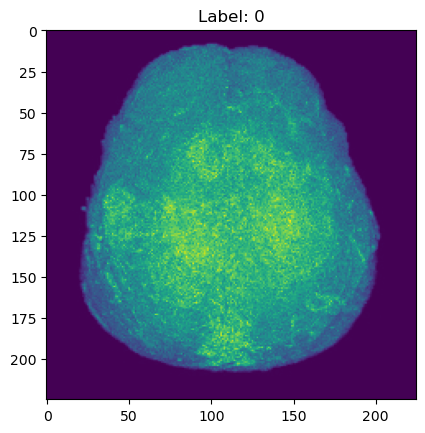

...

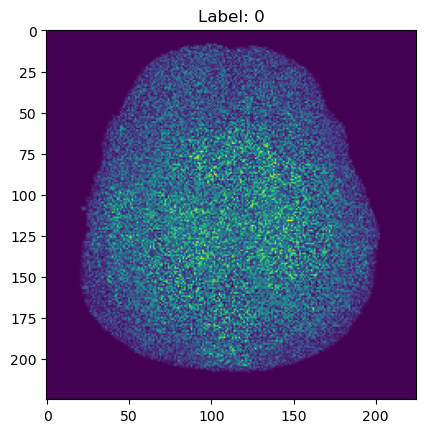

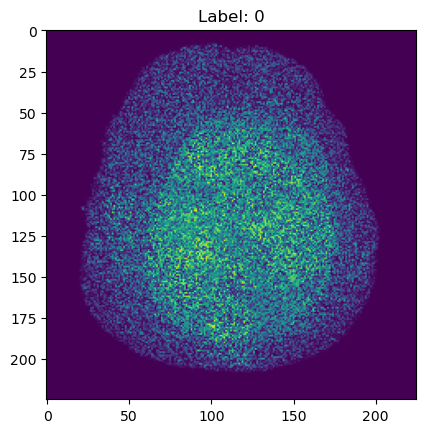

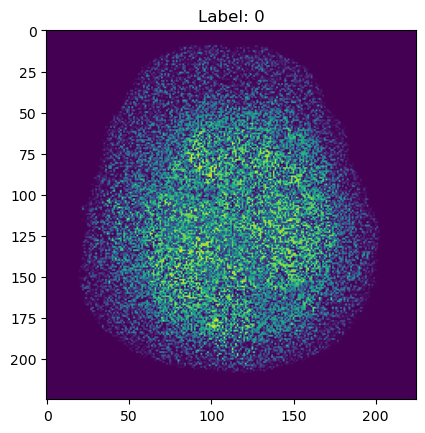

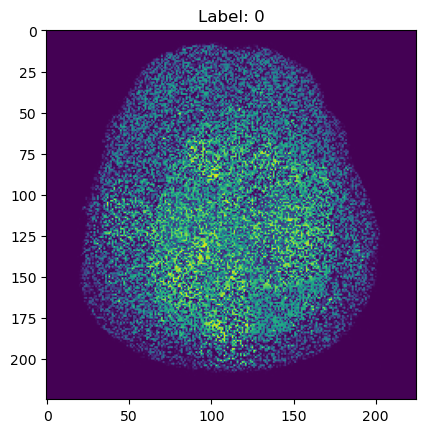

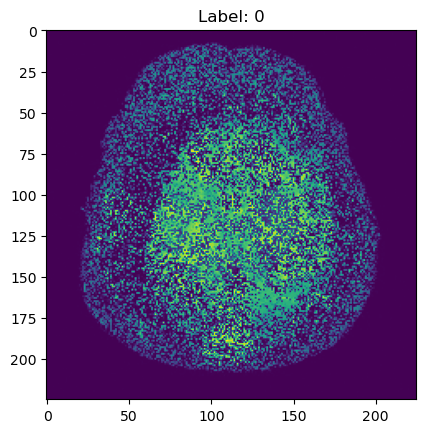

In [10]:
for i in range(len(fooling_images_original_scale)):
    plt.imshow(fooling_images_original_scale[i])
    plt.title(f"Label: {labels[i]}")
    plt.show()